# Data Science Assesment

In [1]:
#Data Preparation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
customers = pd.read_csv(r'C:\Users\LENOVO\Downloads\data\customers_dataset.csv', sep=",")
geolocation = pd.read_csv(r'C:\Users\LENOVO\Downloads\data\geolocation_dataset.csv', sep=",")
order_items = pd.read_csv(r'C:\Users\LENOVO\Downloads\data\order_items_dataset.csv', sep=",")
order_payments = pd.read_csv(r'C:\Users\LENOVO\Downloads\data\order_payments_dataset.csv', sep=",")
order_reviews = pd.read_csv(r'C:\Users\LENOVO\Downloads\data\order_reviews_dataset.csv', sep=",")
orders = pd.read_csv(r'C:\Users\LENOVO\Downloads\data\orders_dataset.csv', sep=",")
product_cnt = pd.read_csv(r'C:\Users\LENOVO\Downloads\data\product_category_name_translation.csv', sep=",")
products = pd.read_csv(r'C:\Users\LENOVO\Downloads\data\products_dataset.csv', sep=",")
sellers = pd.read_csv(r'C:\Users\LENOVO\Downloads\data\sellers_dataset.csv', sep=",")

#### Data Processing

In [3]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [4]:
#the different state in customer_state
customers['customer_state'].unique()

array(['SP', 'SC', 'MG', 'PR', 'RJ', 'RS', 'PA', 'GO', 'ES', 'BA', 'MA',
       'MS', 'CE', 'DF', 'RN', 'PE', 'MT', 'AM', 'AP', 'AL', 'RO', 'PB',
       'TO', 'PI', 'AC', 'SE', 'RR'], dtype=object)

In [5]:
len(customers['customer_state'].unique())

27

In [6]:
customers['customer_state'].mode()

0    SP
dtype: object

In [7]:
correlation=customers.corr()
correlation
## since customer zip code is the only integer data, hence we can't find the data correlation

,customer_zip_code_prefix
customer_zip_code_prefix,1.0


In [8]:
sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [9]:
geolocation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [10]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [11]:
#there are some null values in some columns
orders.isnull().sum().sum()

4908

In [12]:
#look into different type of order status
orders['order_status'].unique()

array(['delivered', 'invoiced', 'shipped', 'processing', 'unavailable',
       'canceled', 'created', 'approved'], dtype=object)

In [13]:
orders.loc[orders['order_status'].str.contains('canceled')]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
397,1b9ecfe83cdc259250e1a8aca174f0ad,6d6b50b66d79f80827b6d96751528d30,canceled,2018-08-04 14:29:27,2018-08-07 04:10:26,NaN,NaN,2018-08-14 00:00:00
613,714fb133a6730ab81fa1d3c1b2007291,e3fe72696c4713d64d3c10afe71e75ed,canceled,2018-01-26 21:34:08,2018-01-26 21:58:39,2018-01-29 22:33:25,NaN,2018-02-22 00:00:00
1058,3a129877493c8189c59c60eb71d97c29,0913cdce793684e52bbfac69d87e91fd,canceled,2018-01-25 13:34:24,2018-01-25 13:50:20,2018-01-26 21:42:18,NaN,2018-02-23 00:00:00
1130,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,NaN,NaN,NaN,2018-09-12 00:00:00
1801,ed3efbd3a87bea76c2812c66a0b32219,191984a8ba4cbb2145acb4fe35b69664,canceled,2018-09-20 13:54:16,NaN,NaN,NaN,2018-10-17 00:00:00
...,...,...,...,...,...,...,...,...
98791,b159d0ce7cd881052da94fa165617b05,e0c3bc5ce0836b975d6b2a8ce7bb0e3e,canceled,2017-03-11 19:51:36,2017-03-11 19:51:36,NaN,NaN,2017-03-30 00:00:00
98909,e49e7ce1471b4693482d40c2bd3ad196,e4e7ab3f449aeb401f0216f86c2104db,canceled,2018-08-07 11:16:28,NaN,NaN,NaN,2018-08-10 00:00:00
99143,6560fb10610771449cb0463c5ba12199,0d07d0a588caf93cc66b7a8aff86d2fe,canceled,2017-10-01 22:26:25,2017-10-01 22:35:22,NaN,NaN,2017-10-27 00:00:00
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaN,NaN,NaN,2018-10-01 00:00:00


In [14]:
orders1=orders[orders["order_status"].str.contains("canceled")==False]
orders1

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


In [15]:
ordersnew=orders1[orders1["order_status"].str.contains("unavailable")==False]
ordersnew

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


In [16]:
order_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [17]:
import seaborn as sns

<AxesSubplot:xlabel='review_score'>

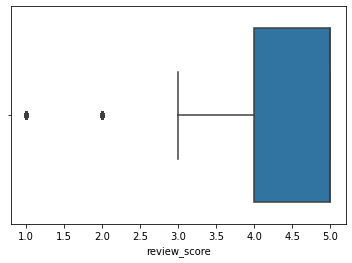

In [18]:
sns.boxplot(x='review_score',data=order_reviews)

In [19]:
order_reviews['review_score'].value_counts()

5    57328
4    19142
1    11424
3     8179
2     3151
Name: review_score, dtype: int64

In [20]:
#drop the review comment title and review comment message columns
order_reviews = order_reviews.drop(['review_comment_title', 'review_comment_message'], axis=1)

In [21]:
order_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


<AxesSubplot:xlabel='payment_installments'>

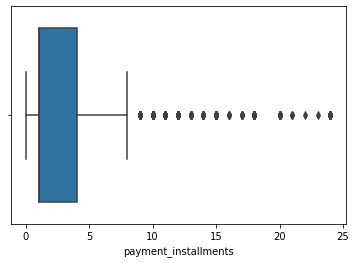

In [22]:
sns.boxplot(x='payment_installments',data=order_payments)

In [23]:
order_payments['payment_installments'].value_counts()

1     52546
2     12413
3     10461
4      7098
10     5328
5      5239
8      4268
6      3920
7      1626
9       644
12      133
15       74
18       27
11       23
24       18
20       17
13       16
14       15
17        8
16        5
21        3
0         2
22        1
23        1
Name: payment_installments, dtype: int64

In [24]:
order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


<AxesSubplot:xlabel='price'>

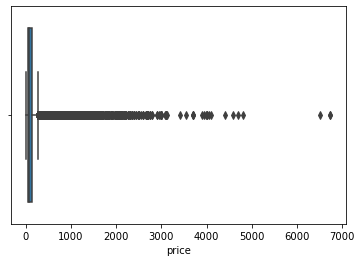

In [25]:
sns.boxplot(x='price',data=order_items)

<AxesSubplot:xlabel='freight_value'>

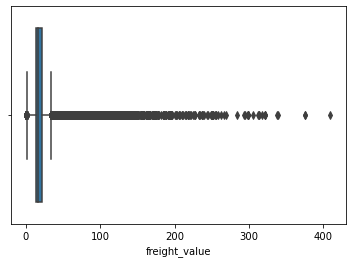

In [26]:
sns.boxplot(x='freight_value',data=order_items)

In [27]:
product_cnt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [28]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [29]:
products[products['product_weight_g'].isnull()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
products = products.drop(['product_name_lenght', 'product_description_lenght','product_photos_qty'], axis=1)

In [31]:
products

,product_id,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,700.0,31.0,13.0,20.0


In [32]:
#fill the null values of product category name into 'unknown'
products['product_category_name'].fillna("unknown", inplace = True)

In [33]:
products[products['product_category_name'].isnull()]

,product_id,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm


### Basic Analytics

In [34]:
#The state of customers on order item list
df1=pd.merge(ordersnew, customers, on='customer_id')
df1=df1[['order_id','customer_id','customer_state']]
df1

,order_id,customer_id,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,SP
...,...,...,...
98202,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,SP
98203,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,SP
98204,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,BA
98205,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,RJ


In [35]:
df1.groupby('customer_state').size().reset_index(name='size').sort_values(['size'], ascending=False)

,customer_state,size
25,SP,41127
18,RJ,12698
10,MG,11496
22,RS,5417
17,PR,4983
23,SC,3600
4,BA,3344
6,DF,2121
7,ES,2018
8,GO,1998


In [36]:
df1[df1.duplicated()]

,order_id,customer_id,customer_state


In [37]:
#The state of sellers on order item list
df2=pd.merge(order_items, sellers, on='seller_id')
df2=df2[['order_id','seller_id','seller_state']]
df2

,order_id,seller_id,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,48436dade18ac8b2bce089ec2a041202,SP
1,0188777fe321843a18be24a6e9aa1e53,48436dade18ac8b2bce089ec2a041202,SP
2,0191bbb5166d4b9a68df11797d5acfa9,48436dade18ac8b2bce089ec2a041202,SP
3,03054d8a8eefc2981cfad06f58e27979,48436dade18ac8b2bce089ec2a041202,SP
4,0c325ea6925de749e1420be0cf43587c,48436dade18ac8b2bce089ec2a041202,SP
...,...,...,...
112645,fdfeec75aa07c1d2a88b17b8fbfc7b8f,dbc51f5e45d654ecc16cb68e6817ecea,SP
112646,fe68b52db13993f58175fa589125d345,3fefda3299e6dfaea3466ef346a3571a,PR
112647,fefacc66af859508bf1a7934eab1e97f,80ceebb4ee9b31afb6c6a916a574a1e2,PR
112648,ff701a7c869ad21de22a6994237c8a00,3e35a8bb43569389d3cebef0ce820f69,SP


In [38]:
df2[df2.duplicated()]

,order_id,seller_id,seller_state
11,1a45c130db33df3cb0e3cd16f0a8ae9d,48436dade18ac8b2bce089ec2a041202,SP
21,3102ea2ab7ac2a1a88a1286fe68d8ed8,48436dade18ac8b2bce089ec2a041202,SP
29,3bc9ec33a0837981e7f5e35876723afb,48436dade18ac8b2bce089ec2a041202,SP
47,60671dbc6a3437884fe12844687b2049,48436dade18ac8b2bce089ec2a041202,SP
62,7c3e480eb90c173aae4ffde40bbaec26,48436dade18ac8b2bce089ec2a041202,SP
...,...,...,...
112635,fc3078fa5d882e59237a658341f57738,b57e8460909fa137df7951b4a3b5ea84,RS
112637,fc32248629afaea92d59f7086de552d3,7a188843479798ca813108fa7b959286,SP
112638,fc32248629afaea92d59f7086de552d3,7a188843479798ca813108fa7b959286,SP
112643,fd607d0a02cb276bc764a15f80f0423f,2a73cba571d90c694b7caca072ccf6ce,SP


In [39]:
newdf2=df2.groupby(['order_id', 'seller_id']).first()
newdf2

,,seller_state
order_id,seller_id,
00010242fe8c5a6d1ba2dd792cb16214,48436dade18ac8b2bce089ec2a041202,SP
00018f77f2f0320c557190d7a144bdd3,dd7ddc04e1b6c2c614352b383efe2d36,SP
000229ec398224ef6ca0657da4fc703e,5b51032eddd242adc84c38acab88f23d,MG
00024acbcdf0a6daa1e931b038114c75,9d7a1d34a5052409006425275ba1c2b4,SP
00042b26cf59d7ce69dfabb4e55b4fd9,df560393f3a51e74553ab94004ba5c87,PR
...,...,...
fffc94f6ce00a00581880bf54a75a037,b8bc237ba3788b23da09c0f1f3a3288c,SC
fffcd46ef2263f404302a634eb57f7eb,f3c38ab652836d21de61fb8314b69182,SP
fffce4705a9662cd70adb13d4a31832d,c3cfdc648177fdbbbb35635a37472c53,PR


In [40]:
newdf2.groupby('seller_state').size().reset_index(name='size').sort_values(['size'], ascending=False)

,seller_state,size
22,SP,70950
8,MG,7942
15,PR,7717
16,RJ,4355
20,SC,3672
19,RS,1991
4,DF,824
2,BA,569
6,GO,463
13,PE,406


In [41]:
#The Product Category name in English on order list
df3=order_items.merge(products, on='product_id').merge(product_cnt, on='product_category_name')
df3=df3[['order_id','product_id','product_category_name_english']]
df3

,order_id,product_id,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,4244733e06e7ecb4970a6e2683c13e61,cool_stuff
1,130898c0987d1801452a8ed92a670612,4244733e06e7ecb4970a6e2683c13e61,cool_stuff
2,532ed5e14e24ae1f0d735b91524b98b9,4244733e06e7ecb4970a6e2683c13e61,cool_stuff
3,6f8c31653edb8c83e1a739408b5ff750,4244733e06e7ecb4970a6e2683c13e61,cool_stuff
4,7d19f4ef4d04461989632411b7e588b9,4244733e06e7ecb4970a6e2683c13e61,cool_stuff
...,...,...,...
111018,b99217b1fcf2fdeace7b8d869b76cb91,57bdf3098169cccdb62221bd3e089cbd,fashion_childrens_clothes
111019,bc3ac768a8963f4ca68942ea6558fc9f,57bdf3098169cccdb62221bd3e089cbd,fashion_childrens_clothes
111020,cab08f0417a702d0f4782ec02356a4ac,8cfc3506cedc0626364457d254429118,fashion_childrens_clothes
111021,cb53f0b6e8f9082a9f5a113765dd1236,8cfc3506cedc0626364457d254429118,fashion_childrens_clothes


In [42]:
df3[df3.duplicated(['order_id'])]

,order_id,product_id,product_category_name_english
14,45c780334bc32cb77559a65c5f171160,5ed9eaf534f6936b51d0b6c5e4d5c2e9,cool_stuff
25,dc12f9e8414131e62897902a78e0286e,5ed9eaf534f6936b51d0b6c5e4d5c2e9,cool_stuff
575,cd577ecda4b9cd34a2193faa1143ce79,8317b177579dd27ff068b83205e2169b,cool_stuff
588,033dbd83c331548108afda89d5bc6b79,29427de7f8a9ee983d9dbc51cec569b4,cool_stuff
755,c9ef97d2854afe64a3b4488bc2836af6,436c8d57ff8d4aa254318e9bd9b48c83,cool_stuff
...,...,...,...
111000,28915ae2a90c218f0c2b7f8e0fb280e0,e2dd0cb9b99517a86cbc9441cbb55348,la_cuisine
111003,3821dc9ac1b25bed42324d0885b0a930,33900d427fa4bd3f509cdacda72e84a3,la_cuisine
111007,8f95199a6809023bbfabcd9759bd04a1,d29534bc8c74cd3d91e0f175a5c9b366,la_cuisine
111018,b99217b1fcf2fdeace7b8d869b76cb91,57bdf3098169cccdb62221bd3e089cbd,fashion_childrens_clothes


In [43]:
newdf3=df3.groupby(['order_id', 'product_id']).first()
newdf3

,,product_category_name_english
order_id,product_id,
00010242fe8c5a6d1ba2dd792cb16214,4244733e06e7ecb4970a6e2683c13e61,cool_stuff
00018f77f2f0320c557190d7a144bdd3,e5f2d52b802189ee658865ca93d83a8f,pet_shop
000229ec398224ef6ca0657da4fc703e,c777355d18b72b67abbeef9df44fd0fd,furniture_decor
00024acbcdf0a6daa1e931b038114c75,7634da152a4610f1595efa32f14722fc,perfumery
00042b26cf59d7ce69dfabb4e55b4fd9,ac6c3623068f30de03045865e4e10089,garden_tools
...,...,...
fffc94f6ce00a00581880bf54a75a037,4aa6014eceb682077f9dc4bffebc05b0,housewares
fffcd46ef2263f404302a634eb57f7eb,32e07fd915822b0765e448c4dd74c828,computers_accessories
fffce4705a9662cd70adb13d4a31832d,72a30483855e2eafc67aee5dc2560482,sports_leisure


In [44]:
newdf3.groupby('product_category_name_english').size().reset_index(name='size').sort_values(['size'], ascending=False)

,product_category_name_english,size
7,bed_bath_table,10160
43,health_beauty,9022
65,sports_leisure,7858
15,computers_accessories,6887
39,furniture_decor,6781
...,...,...
3,arts_and_craftmanship,24
52,la_cuisine,13
11,cds_dvds_musicals,12
29,fashion_childrens_clothes,8


In [45]:
#The Location of which the Customers made order
df4=ordersnew.merge(customers, on='customer_id').merge(geolocation, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix')
df4=df4[['order_id','customer_id','customer_zip_code_prefix','geolocation_lat','geolocation_lng','geolocation_city','geolocation_state']]
df4

,order_id,customer_id,customer_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,3149,-23.574809,-46.587471,sao paulo,SP
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,3149,-23.578333,-46.587123,sao paulo,SP
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,3149,-23.574809,-46.587471,sao paulo,SP
3,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,3149,-23.575033,-46.587451,sao paulo,SP
4,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,3149,-23.580054,-46.586673,sao paulo,SP
...,...,...,...,...,...,...,...
14897958,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,45920,-17.907792,-39.374387,nova viçosa,BA
14897959,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,45920,-17.898294,-39.371730,nova vicosa,BA
14897960,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,45920,-17.890630,-39.368081,nova vicosa,BA
14897961,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,45920,-17.912151,-39.389831,nova vicosa,BA


In [46]:
newdf4=df4.groupby(['order_id', 'customer_id']).first()
newdf4

,,customer_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
order_id,customer_id,,,,,
00010242fe8c5a6d1ba2dd792cb16214,3ce436f183e68e07877b285a838db11a,28013,-21.758076,-41.312633,campos dos goytacazes,RJ
00018f77f2f0320c557190d7a144bdd3,f6dd3ec061db4e3987629fe6b26e5cce,15775,-20.212393,-50.941471,santa fe do sul,SP
000229ec398224ef6ca0657da4fc703e,6489ae5e4333f3693df5ad4372dab6d3,35661,-19.860439,-44.597972,pará de minas,MG
00024acbcdf0a6daa1e931b038114c75,d4eb9395c8c0431ee92fce09860c5a06,12952,-23.144923,-46.539830,atibaia,SP
00042b26cf59d7ce69dfabb4e55b4fd9,58dbd0b2d70206bf40e62cd34e84d795,13226,-23.249008,-46.824961,varzea paulista,SP
...,...,...,...,...,...,...
fffc94f6ce00a00581880bf54a75a037,b51593916b4b8e0d6f66f2ae24f2673d,65077,-2.490420,-44.303287,sao luis,MA
fffcd46ef2263f404302a634eb57f7eb,84c5d4fbaf120aae381fad077416eaa0,81690,-25.601485,-49.317700,curitiba,PR
fffce4705a9662cd70adb13d4a31832d,29309aa813182aaddc9b259e31b870e6,4039,-23.597813,-46.650272,sao paulo,SP


In [47]:
import sys
'geopandas' in sys.modules

#Geopandas unable to be imported, instead plotting maps using plotly

False

In [48]:
#pip install plotly

In [49]:
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px

In [50]:
fig = px.density_mapbox(newdf4, lat='geolocation_lat', lon='geolocation_lng', radius=10,
                       center=dict(lat=9,lon=9), zoom=1, mapbox_style='stamen-watercolor',
                       title='Map Plotting')

In [51]:
fig.show()

In [52]:
#Correlation between size and weight of the product to the freight value
df5=order_items.merge(products, on='product_id')
df5=df5[['order_id','product_id','product_weight_g','product_length_cm','product_height_cm','product_width_cm','freight_value']]
df5

,order_id,product_id,product_weight_g,product_length_cm,product_height_cm,product_width_cm,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,13.29
1,130898c0987d1801452a8ed92a670612,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,17.96
2,532ed5e14e24ae1f0d735b91524b98b9,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,18.33
3,6f8c31653edb8c83e1a739408b5ff750,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,16.17
4,7d19f4ef4d04461989632411b7e588b9,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,13.29
...,...,...,...,...,...,...,...
112645,ffebd80e3291e811c308365936897efd,4cc4d02efc8f249c13355147fb44e34d,6700.0,35.0,12.0,22.0,51.20
112646,ffee31fb4b5e35c9123608015637c495,b10ecf8e33aaaea419a9fa860ea80fb5,2300.0,37.0,30.0,20.0,13.52
112647,fff7c4452f050315db1b3f24d9df5fcd,dd469c03ad67e201bc2179ef077dcd48,400.0,19.0,9.0,15.0,20.91
112648,fffa82886406ccf10c7b4e35c4ff2788,bbe7651fef80287a816ead73f065fc4b,2700.0,60.0,15.0,15.0,44.02


In [53]:
df5=df5.dropna()
df5

,order_id,product_id,product_weight_g,product_length_cm,product_height_cm,product_width_cm,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,13.29
1,130898c0987d1801452a8ed92a670612,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,17.96
2,532ed5e14e24ae1f0d735b91524b98b9,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,18.33
3,6f8c31653edb8c83e1a739408b5ff750,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,16.17
4,7d19f4ef4d04461989632411b7e588b9,4244733e06e7ecb4970a6e2683c13e61,650.0,28.0,9.0,14.0,13.29
...,...,...,...,...,...,...,...
112645,ffebd80e3291e811c308365936897efd,4cc4d02efc8f249c13355147fb44e34d,6700.0,35.0,12.0,22.0,51.20
112646,ffee31fb4b5e35c9123608015637c495,b10ecf8e33aaaea419a9fa860ea80fb5,2300.0,37.0,30.0,20.0,13.52
112647,fff7c4452f050315db1b3f24d9df5fcd,dd469c03ad67e201bc2179ef077dcd48,400.0,19.0,9.0,15.0,20.91
112648,fffa82886406ccf10c7b4e35c4ff2788,bbe7651fef80287a816ead73f065fc4b,2700.0,60.0,15.0,15.0,44.02


In [54]:
correlation=df5.corr()
correlation

,product_weight_g,product_length_cm,product_height_cm,product_width_cm,freight_value
product_weight_g,1.000000,0.460919,0.583277,0.506609,0.610420
product_length_cm,0.460919,1.000000,0.192895,0.532537,0.309086
product_height_cm,0.583277,0.192895,1.000000,0.281224,0.391831
product_width_cm,0.506609,0.532537,0.281224,1.000000,0.323777
freight_value,0.610420,0.309086,0.391831,0.323777,1.000000


<AxesSubplot:>

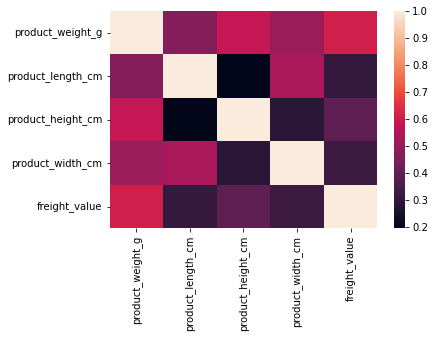

In [55]:
sns.heatmap(correlation)

In [56]:
import scipy.stats as st

In [57]:
#using scipy
st.pearsonr(df5['product_weight_g'], df5['freight_value'])

(0.6104202350973074, 0.0)

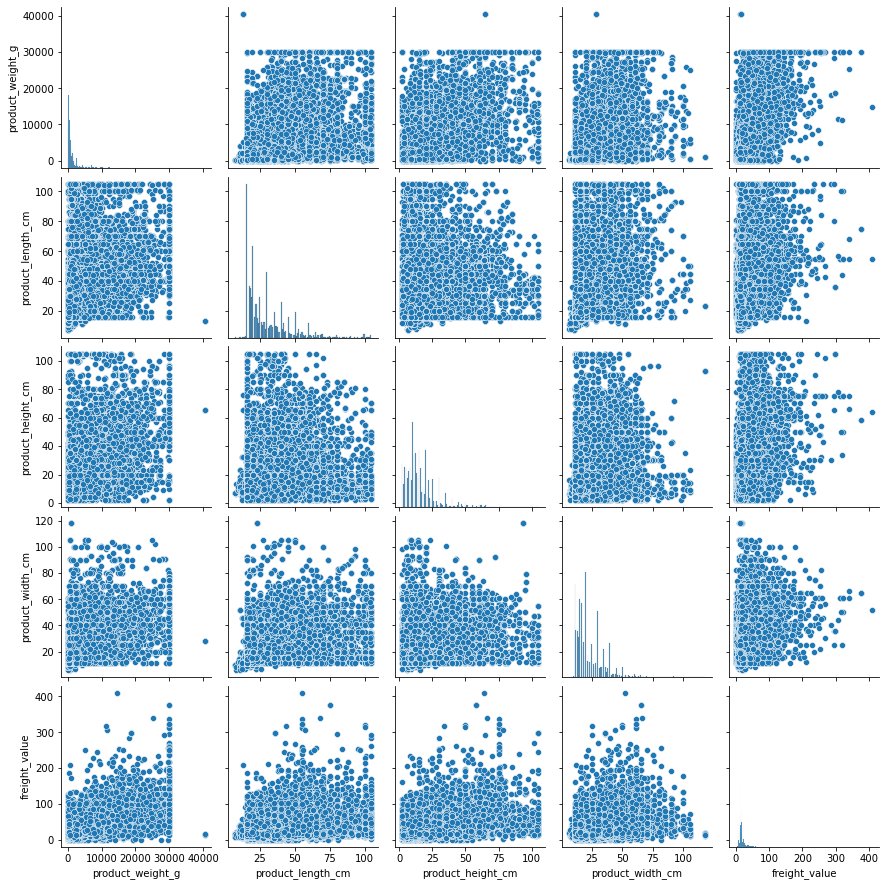

In [58]:
sns.pairplot(df5)

In [59]:
from scipy.stats import spearmanr

In [60]:
spearmanr(df5['product_weight_g'], df5['freight_value'])

SpearmanrResult(correlation=0.4465908170596794, pvalue=0.0)

### Advanced Analytics

In [61]:
#Forecast Analysis of the Order Purchased Time
from matplotlib.pylab import rcParams

In [62]:
data=ordersnew[['order_id','order_purchase_timestamp']]
data

,order_id,order_purchase_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33
1,53cdb2fc8bc7dce0b6741e2150273451,2018-07-24 20:41:37
2,47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:38:49
3,949d5b44dbf5de918fe9c16f97b45f8a,2017-11-18 19:28:06
4,ad21c59c0840e6cb83a9ceb5573f8159,2018-02-13 21:18:39
...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,2017-03-09 09:54:05
99437,63943bddc261676b46f01ca7ac2f7bd8,2018-02-06 12:58:58
99438,83c1379a015df1e13d02aae0204711ab,2017-08-27 14:46:43
99439,11c177c8e97725db2631073c19f07b62,2018-01-08 21:28:27


In [63]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98207 entries, 0 to 99440
Data columns (total 2 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   order_id                  98207 non-null  object
 1   order_purchase_timestamp  98207 non-null  object
dtypes: object(2)
memory usage: 2.2+ MB


In [64]:
pd.options.mode.chained_assignment = None

In [65]:
data["order_purchase_timestamp"] = pd.to_datetime(data["order_purchase_timestamp"], infer_datetime_format=True)

In [66]:
indexedData = data.set_index(['order_purchase_timestamp'])

In [67]:
data['order_purchase_timestamp'].min()

Timestamp('2016-09-04 21:15:19')

In [68]:
data['order_purchase_timestamp'].max()

Timestamp('2018-09-03 09:06:57')

In [69]:
#get the month year from the dataset
data['month_year'] = data['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y-%m'))

In [70]:
#grouping month and year
dfgroup1=data.groupby('month_year').count()['order_id'].reset_index(name='orders')
dfgroup1

,month_year,orders
0,2016-09,2
1,2016-10,293
2,2016-12,1
3,2017-01,787
4,2017-02,1718
5,2017-03,2617
6,2017-04,2377
7,2017-05,3640
8,2017-06,3205
9,2017-07,3946


In [71]:
dfgroup1.describe()

,orders
count,24.000000
mean,4091.958333
std,2605.963303
min,1.000000
25%,2212.250000
50%,4249.500000
75%,6472.000000
max,7423.000000


In [72]:
box = px.box(dfgroup1, x='orders')
box.show()

In [73]:
#clear outliers
dfgroup=dfgroup1.drop([0,2,23])
dfgroup

,month_year,orders
1,2016-10,293
3,2017-01,787
4,2017-02,1718
5,2017-03,2617
6,2017-04,2377
7,2017-05,3640
8,2017-06,3205
9,2017-07,3946
10,2017-08,4272
11,2017-09,4227


In [74]:
box = px.box(dfgroup, x='orders')
box.show()

In [75]:
def find_outliers_IQR(df):
   q1=df.quantile(0.25)
   q3=df.quantile(0.75)
   IQR=q3-q1
   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
   return outliers

In [76]:
outliers = find_outliers_IQR(dfgroup['orders'])
print('number of outliers: '+ str(len(outliers)))
print('max outlier value: '+ str(outliers.max()))
print('min outlier value: '+ str(outliers.min()))
outliers

number of outliers: 0
max outlier value: nan
min outlier value: nan


Series([], Name: orders, dtype: int64)

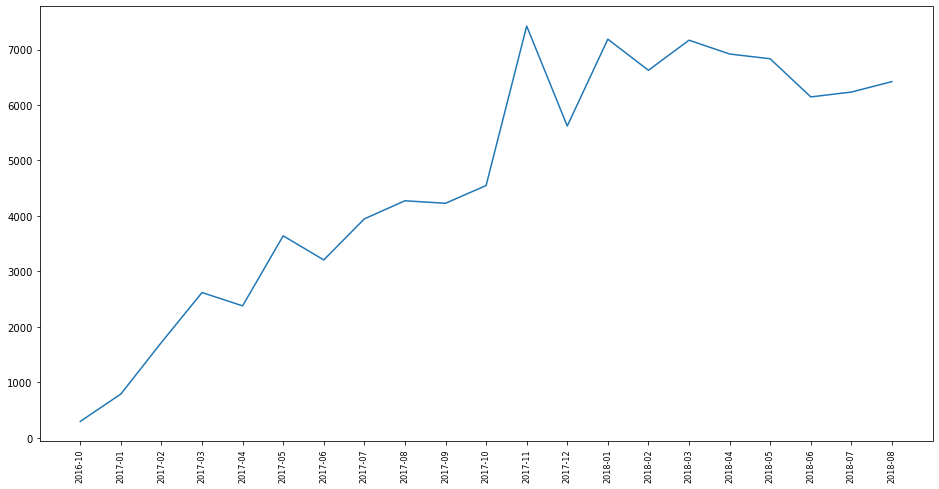

In [77]:
plt.figure(figsize=(16,8))
plt.plot(dfgroup['month_year'], dfgroup['orders'])
plt.xticks(rotation='vertical', size=8)
plt.show()

In [78]:
indexdata = dfgroup.set_index(['month_year'])
indexdata

,orders
month_year,
2016-10,293
2017-01,787
2017-02,1718
2017-03,2617
2017-04,2377
2017-05,3640
2017-06,3205
2017-07,3946
2017-08,4272


In [79]:
#determining rolling statistics
rolmean=indexdata.rolling(window=12).mean()
rolstd=indexdata.rolling(window=12).std()
print(rolmean, rolstd)

                 orders
month_year             
2016-10             NaN
2017-01             NaN
2017-02             NaN
2017-03             NaN
2017-04             NaN
2017-05             NaN
2017-06             NaN
2017-07             NaN
2017-08             NaN
2017-09             NaN
2017-10             NaN
2017-11     3254.333333
2017-12     3698.250000
2018-01     4231.583333
2018-02     4640.500000
2018-03     5019.750000
2018-04     5398.250000
2018-05     5664.333333
2018-06     5909.333333
2018-07     6099.916667
2018-08     6279.000000                  orders
month_year             
2016-10             NaN
2017-01             NaN
2017-02             NaN
2017-03             NaN
2017-04             NaN
2017-05             NaN
2017-06             NaN
2017-07             NaN
2017-08             NaN
2017-09             NaN
2017-10             NaN
2017-11     1908.200644
2017-12     1771.380208
2018-01     1778.618793
2018-02     1710.983795
2018-03     1726.000586
2018-04     1586

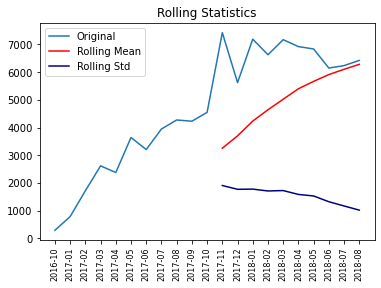

In [80]:
#plot rolling statistics
orig = plt.plot(indexdata['orders'], label='Original')
mean = plt.plot(rolmean, color='red', label='Rolling Mean')
std = plt.plot(rolstd, color='navy', label='Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Statistics')
plt.xticks(rotation='vertical', size=8)
plt.show(block=False)

In [81]:
#Dickey-Fuller test
from statsmodels.tsa.stattools import adfuller

dftest = adfuller(indexdata['orders'], autolag='AIC')
dfoutput = pd.Series(dftest[0:4], index=['Test Statistics', 'p-value', '#Lags Used', 'Number of observations used'])
for key,value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key]=value
print(dfoutput)

Test Statistics                -2.518704
p-value                         0.110989
#Lags Used                      1.000000
Number of observations used    19.000000
Critical Value (1%)            -3.832603
Critical Value (5%)            -3.031227
Critical Value (10%)           -2.655520
dtype: float64


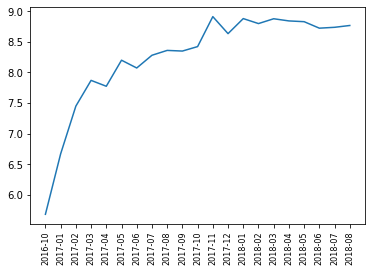

In [82]:
#Estimating Trend
indexdata_logScale = np.log(indexdata)
plt.xticks(rotation='vertical', size=8)
plt.plot(indexdata_logScale)

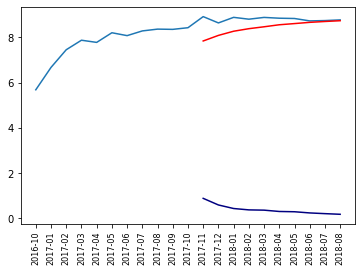

In [83]:
movingAverage = indexdata_logScale.rolling(window=12).mean()
movingSTD = indexdata_logScale.rolling(window=12).std()
plt.xticks(rotation='vertical', size=8)
plt.plot(indexdata_logScale)
plt.plot(movingAverage, color='red')
plt.plot(movingSTD, color='navy')

In [84]:
check = indexdata_logScale - movingAverage
check

,orders
month_year,
2016-10,NaN
2017-01,NaN
2017-02,NaN
2017-03,NaN
2017-04,NaN
2017-05,NaN
2017-06,NaN
2017-07,NaN
2017-08,NaN


In [85]:
#Remove Nan Values
check.dropna(inplace=True)
check

,orders
month_year,
2017-11,1.075921
2017-12,0.551510
2018-01,0.613136
2018-02,0.419238
2018-03,0.414048
2018-04,0.289656
2018-05,0.224667
2018-06,0.064298
2018-07,0.040421


In [86]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determine Rolling Statistics
    movingAverage = timeseries.rolling(window=12).mean()
    movingSTD = timeseries.rolling(window=12).std()

    #Plot Rolling Statistics
    orig = plt.plot(timeseries['orders'], label='Original')
    mean = plt.plot(movingAverage, color='red', label='Rolling Mean')
    std = plt.plot(movingSTD, color='navy', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Statistics')
    plt.xticks(rotation='vertical', size=8)
    plt.show(block=False)

    #Dickey-Fuller test
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries['orders'], autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistics', 'p-value', '#Lags Used', 'Number of observations used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key]=value
    print(dfoutput)

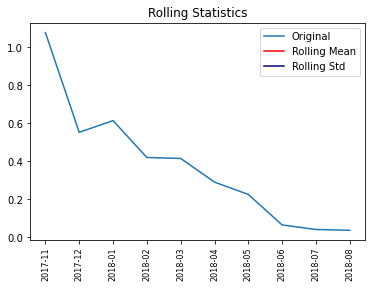

Results of Dickey-Fuller Test:
Test Statistics               -1.117668
p-value                        0.707975
#Lags Used                     3.000000
Number of observations used    6.000000
Critical Value (1%)           -5.354256
Critical Value (5%)           -3.646238
Critical Value (10%)          -2.901198
dtype: float64


In [87]:
test_stationarity(check)

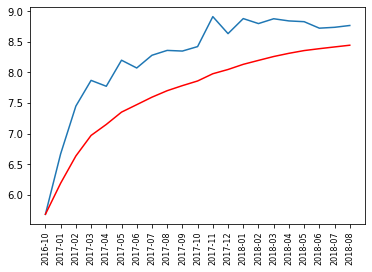

In [88]:
exponent = indexdata_logScale.ewm(halflife=12, min_periods=0, adjust=True).mean()
plt.xticks(rotation='vertical', size=8)
plt.plot(indexdata_logScale)
plt.plot(exponent, color='red')

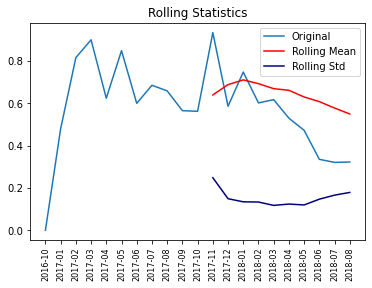

Results of Dickey-Fuller Test:
Test Statistics                -2.111231
p-value                         0.240023
#Lags Used                      1.000000
Number of observations used    19.000000
Critical Value (1%)            -3.832603
Critical Value (5%)            -3.031227
Critical Value (10%)           -2.655520
dtype: float64


In [89]:
check2 = indexdata_logScale - exponent
test_stationarity(check2)

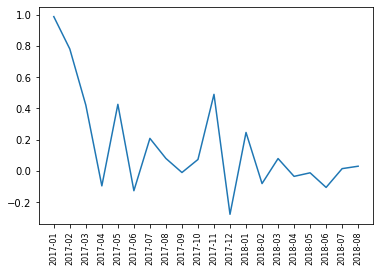

In [90]:
shifting = indexdata_logScale - indexdata_logScale.shift()
plt.xticks(rotation='vertical', size=8)
plt.plot(shifting)

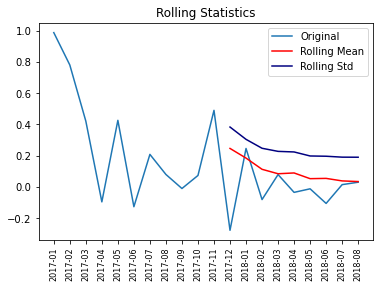

Results of Dickey-Fuller Test:
Test Statistics                -4.231953
p-value                         0.000581
#Lags Used                      0.000000
Number of observations used    19.000000
Critical Value (1%)            -3.832603
Critical Value (5%)            -3.031227
Critical Value (10%)           -2.655520
dtype: float64


In [91]:
shifting.dropna(inplace=True)
test_stationarity(shifting)
#since p-value<0.05 means that the data is stationary now

In [92]:
indexdata_logScale.sort_index(inplace=True)
indexdata_logScale

,orders
month_year,
2016-10,5.680173
2017-01,6.668228
2017-02,7.448916
2017-03,7.869784
2017-04,7.773594
2017-05,8.199739
2017-06,8.072467
2017-07,8.280458
2017-08,8.359837


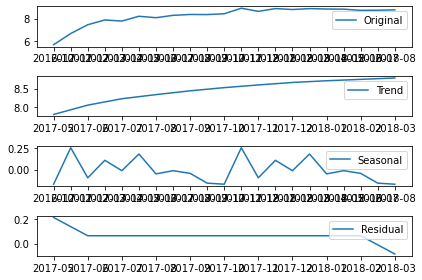

In [93]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(indexdata_logScale, period = len(indexdata_logScale)//2)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

plt.subplot(411)
plt.plot(indexdata_logScale, label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal, label='Seasonal')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residual')
plt.legend(loc='best')
plt.tight_layout()

In [94]:
decomposedLog=residual
decomposedLog.dropna(inplace=True)
decomposedLog

month_year
2017-05    0.214029
2017-06    0.065036
2017-07    0.065036
2017-08    0.065036
2017-09    0.065036
2017-10    0.065036
2017-11    0.065036
2017-12    0.065036
2018-01    0.065036
2018-02    0.065036
2018-03   -0.083958
Name: resid, dtype: float64

In [95]:
decLog=decomposedLog.reset_index(name='orders')
decLog

,month_year,orders
0,2017-05,0.214029
1,2017-06,0.065036
2,2017-07,0.065036
3,2017-08,0.065036
4,2017-09,0.065036
5,2017-10,0.065036
6,2017-11,0.065036
7,2017-12,0.065036
8,2018-01,0.065036
9,2018-02,0.065036


In [96]:
decLog.set_index(['month_year'])
decLog

,month_year,orders
0,2017-05,0.214029
1,2017-06,0.065036
2,2017-07,0.065036
3,2017-08,0.065036
4,2017-09,0.065036
5,2017-10,0.065036
6,2017-11,0.065036
7,2017-12,0.065036
8,2018-01,0.065036
9,2018-02,0.065036


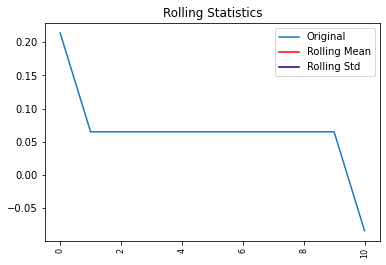

Results of Dickey-Fuller Test:
Test Statistics                -2.529822
p-value                         0.108386
#Lags Used                      0.000000
Number of observations used    10.000000
Critical Value (1%)            -4.331573
Critical Value (5%)            -3.232950
Critical Value (10%)           -2.748700
dtype: float64


In [97]:
test_stationarity(decLog)

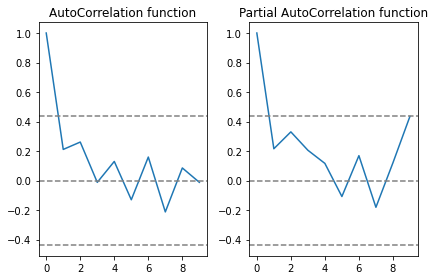

In [98]:
#ACF and PACF plots:
from statsmodels.tsa.stattools import acf, pacf

lag_acf = acf(shifting, nlags=9, fft=False)
lag_pacf = pacf(shifting, nlags=9, method='ols')

#Plot_ACF
plt.subplot(121)
plt.plot(lag_acf)
plt.axhline(y=0, linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(shifting)), linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(shifting)), linestyle='--',color='gray')
plt.title('AutoCorrelation function')

#Plot_PACF
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0, linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(shifting)), linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(shifting)), linestyle='--',color='gray')
plt.title('Partial AutoCorrelation function')
plt.tight_layout()

C:\Users\LENOVO\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)


C:\Users\LENOVO\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. fore

Plotting AR Model


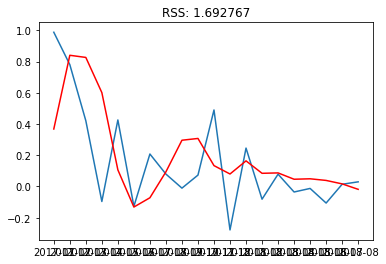

In [99]:
from statsmodels.tsa.arima_model import ARIMA

#AR MODEL
model = ARIMA(indexdata_logScale, order=(2,1,2))
results_AR = model.fit(disp=-1)
plt.plot(shifting)
plt.plot(results_AR.fittedvalues,color='red')
plt.title('RSS: %4f'% sum((results_AR.fittedvalues-shifting['orders'])**2))
print('Plotting AR Model')

C:\Users\LENOVO\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\LENOVO\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



Plotting MA Model


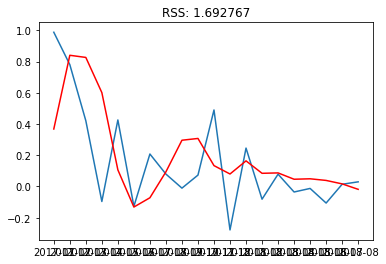

In [100]:
#MA MODEL
model = ARIMA(indexdata_logScale, order=(2,1,2))
results_MA = model.fit(disp=-1)
plt.plot(shifting)
plt.plot(results_MA.fittedvalues,color='red')
plt.title('RSS: %4f'% sum((results_MA.fittedvalues-shifting['orders'])**2))
print('Plotting MA Model')

C:\Users\LENOVO\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

C:\Users\LENOVO\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



Plotting MA Model


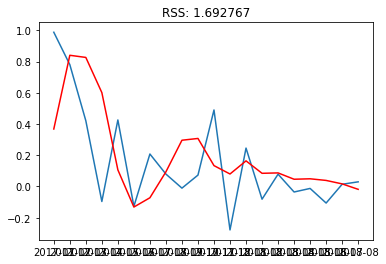

In [101]:
model = ARIMA(indexdata_logScale, order=(2,1,2))
results_ARIMA = model.fit(disp=-1)
plt.plot(shifting)
plt.plot(results_ARIMA.fittedvalues,color='red')
plt.title('RSS: %4f'% sum((results_MA.fittedvalues-shifting['orders'])**2))
print('Plotting MA Model')

In [102]:
predictions_ARIMA_diff = pd.Series(results_ARIMA.fittedvalues, copy=True)
print(predictions_ARIMA_diff)

month_year
2017-01    0.368215
2017-02    0.840469
2017-03    0.826726
2017-04    0.601300
2017-05    0.106356
2017-06   -0.131687
2017-07   -0.072244
2017-08    0.094006
2017-09    0.296324
2017-10    0.307663
2017-11    0.133658
2017-12    0.080008
2018-01    0.164088
2018-02    0.084433
2018-03    0.086934
2018-04    0.046379
2018-05    0.049261
2018-06    0.038758
2018-07    0.016617
2018-08   -0.018190
dtype: float64


In [103]:
#Conver to cumulative sum
predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
print(predictions_ARIMA_diff_cumsum)

month_year
2017-01    0.368215
2017-02    1.208684
2017-03    2.035410
2017-04    2.636710
2017-05    2.743066
2017-06    2.611379
2017-07    2.539135
2017-08    2.633141
2017-09    2.929465
2017-10    3.237129
2017-11    3.370786
2017-12    3.450795
2018-01    3.614883
2018-02    3.699316
2018-03    3.786250
2018-04    3.832629
2018-05    3.881890
2018-06    3.920648
2018-07    3.937265
2018-08    3.919075
dtype: float64


In [104]:
predictions_ARIMA_log = pd.Series(indexdata_logScale['orders'], index=indexdata_logScale.index)
predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum, fill_value=0)
predictions_ARIMA_log

month_year
2016-10     5.680173
2017-01     7.036443
2017-02     8.657600
2017-03     9.905194
2017-04    10.410304
2017-05    10.942805
2017-06    10.683847
2017-07    10.819593
2017-08    10.992979
2017-09    11.278713
2017-10    11.659352
2017-11    12.283125
2017-12    12.084881
2018-01    12.494912
2018-02    12.497921
2018-03    12.663632
2018-04    12.674655
2018-05    12.711409
2018-06    12.644042
2018-07    12.674878
2018-08    12.686404
dtype: float64

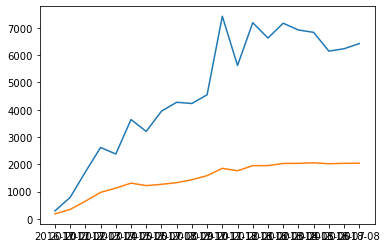

In [105]:
predictions_ARIMA=np.power(predictions_ARIMA_log,3)
plt.plot(indexdata)
plt.plot(predictions_ARIMA)

In [106]:
predictions_ARIMA

month_year
2016-10     183.267139
2017-01     348.385095
2017-02     648.922047
2017-03     971.826951
2017-04    1128.210781
2017-05    1310.345958
2017-06    1219.503145
2017-07    1266.580388
2017-08    1328.452957
2017-09    1434.758036
2017-10    1584.977863
2017-11    1853.218433
2017-12    1764.928770
2018-01    1950.740987
2018-02    1952.150845
2018-03    2030.835760
2018-04    2036.143794
2018-05    2053.908344
2018-06    2021.425787
2018-07    2036.251421
2018-08    2041.811349
dtype: float64

In [107]:
indexdata_logScale.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21 entries, 2016-10 to 2018-08
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   orders  21 non-null     float64
dtypes: float64(1)
memory usage: 336.0+ bytes


C:\Users\LENOVO\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\LENOVO\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\LENOVO\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



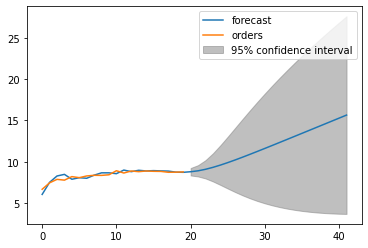

In [108]:
#Predict the next 21 months
results_ARIMA.plot_predict(1,42)
x=results_ARIMA.forecast(steps=21)